In [ ]:
!pip -q install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 57.5 MB/s eta 0:00:00


In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import canny
from skimage.filters import sobel, prewitt, roberts, laplace
from skimage.color import rgb2gray
from skimage.transform import probabilistic_hough_line

# RGB

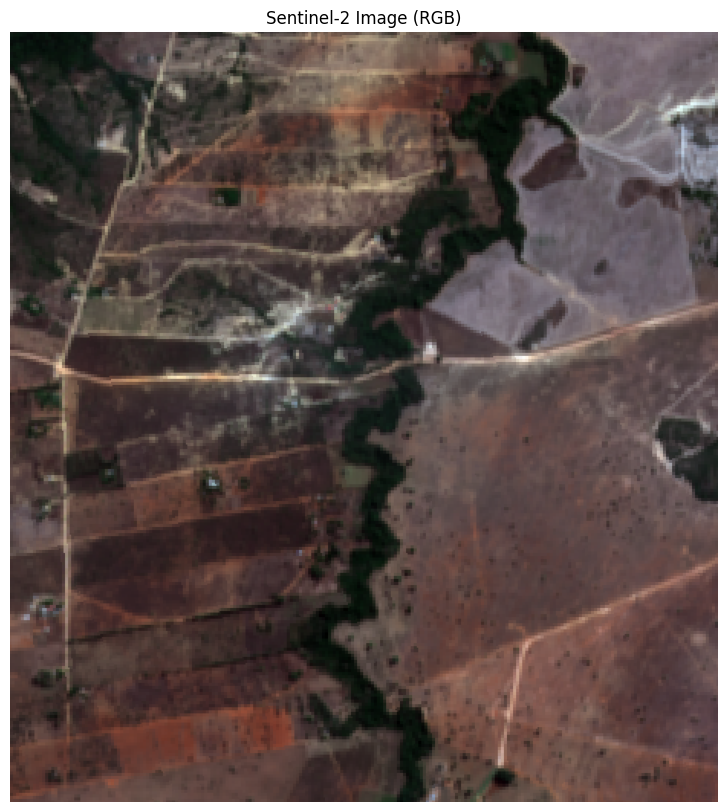

In [ ]:
# plot img
with rasterio.open('minitile5.tif') as src:
    # read bands
    b4 = src.read(4)
    b3 = src.read(3)
    b2 = src.read(2)

    # normalize to 0-1 range
    b4_norm = (b4 - np.min(b4)) / (np.max(b4) - np.min(b4))
    b3_norm = (b3 - np.min(b3)) / (np.max(b3) - np.min(b3))
    b2_norm = (b2 - np.min(b2)) / (np.max(b2) - np.min(b2))

    # stack bands
    rgb = np.dstack((b4_norm, b3_norm, b2_norm))

    # plot
    plt.figure(figsize=(10, 10))
    plt.imshow(rgb)
    plt.title('Sentinel-2 Image (RGB)')
    plt.axis('off')
    plt.show()

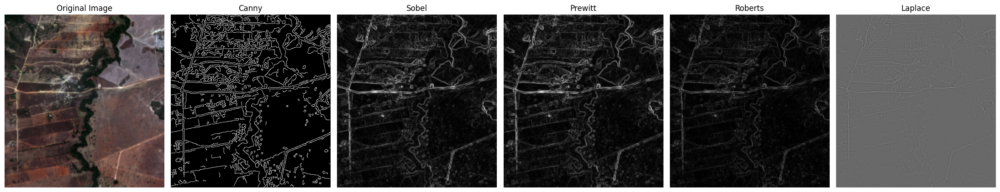

In [ ]:
# convert rgb to grey
gray_image = rgb2gray(rgb)

# apply edge detectors
canny_edges = canny(gray_image)
sobel_edges = sobel(gray_image)
prewitt_edges = prewitt(gray_image)
roberts_edges = roberts(gray_image)
laplace_edges = laplace(gray_image, ksize=3)

# plot
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(22, 7))

axes[0].imshow(gray_image)
axes[0].set_title('Input Image')
axes[0].axis('off')

axes[1].imshow(canny_edges, cmap='gray')
axes[1].set_title('Canny')
axes[1].axis('off')

axes[2].imshow(sobel_edges, cmap='gray')
axes[2].set_title('Sobel')
axes[2].axis('off')

axes[3].imshow(prewitt_edges, cmap='gray')
axes[3].set_title('Prewitt')
axes[3].axis('off')

axes[4].imshow(roberts_edges, cmap='gray')
axes[4].set_title('Roberts')
axes[4].axis('off')

axes[5].imshow(laplace_edges, cmap='gray')
axes[5].set_title('Laplace')
axes[5].axis('off')

plt.tight_layout()
plt.show()

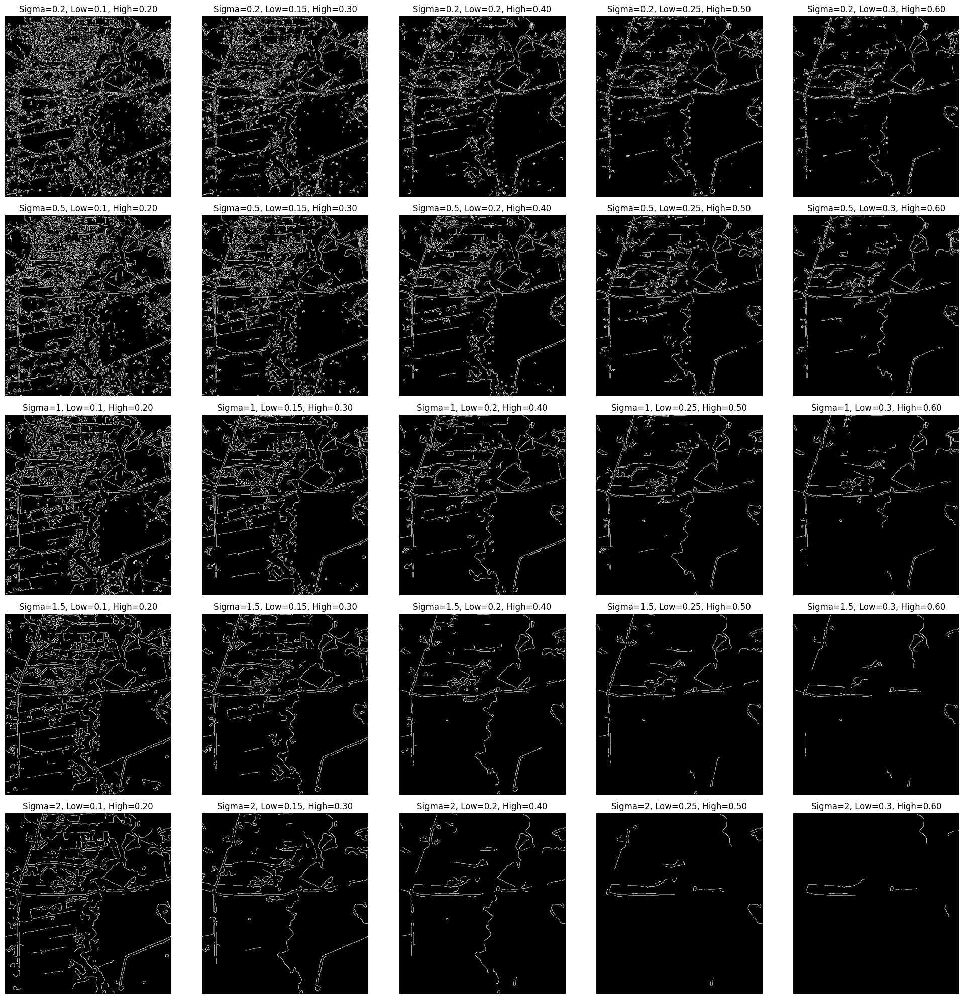

In [ ]:
# canny params
sigma_values = [0.2, 0.5, 1, 1.5, 2]  # Example sigma values
low_threshold_ratios = [0.1, 0.15, 0.2, 0.25, 0.3] # Example low threshold ratios

# config plot
fig, axes = plt.subplots(nrows=len(sigma_values), ncols=len(low_threshold_ratios), figsize=(20, 20))

# get edges and plot
for i, sigma in enumerate(sigma_values):
    for j, low_threshold_ratio in enumerate(low_threshold_ratios):
      high_threshold_ratio = low_threshold_ratio * 2
      canny_edges = canny(gray_image, sigma=sigma, low_threshold=low_threshold_ratio, high_threshold=high_threshold_ratio)
      axes[i, j].imshow(canny_edges, cmap='gray')
      axes[i, j].set_title('Sigma={}, Low={}, High={:.2f}'.format(sigma, low_threshold_ratio, high_threshold_ratio))
      axes[i, j].axis('off')


plt.tight_layout()
plt.show()

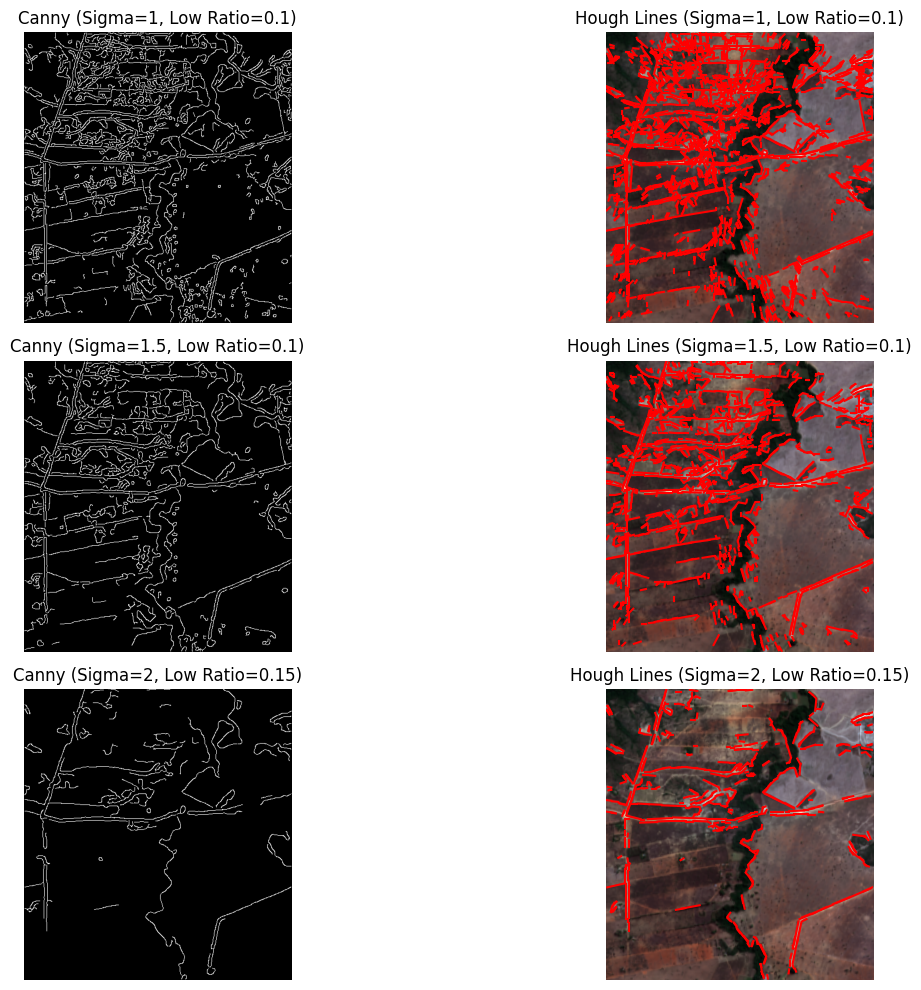

In [ ]:
# parameter settings: no separation, some separation, high separation
sigma_low_values = ((1, 0.1), (1.5, 0.1), (2, 0.15))

# config plot
fig, axes = plt.subplots(nrows=len(sigma_low_values), ncols=2, figsize=(15, 10))

for i, (sigma, low_ratio) in enumerate(sigma_low_values):
    high_ratio = low_ratio * 2
    canny_edges = canny(gray_image, sigma=sigma, low_threshold=low_ratio, high_threshold=high_ratio)

    # apply hough
    hough_lines = probabilistic_hough_line(canny_edges, threshold=10, line_length=5, line_gap=3)

    # plot
    axes[i, 0].imshow(canny_edges, cmap='gray')
    axes[i, 0].set_title(f'Canny (Sigma={sigma}, Low Ratio={low_ratio})')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(rgb)
    for line in hough_lines:
        p0, p1 = line
        axes[i, 1].plot((p0[0], p1[0]), (p0[1], p1[1]), color='red')
    axes[i, 1].set_title(f'Hough Lines (Sigma={sigma}, Low Ratio={low_ratio})')
    axes[i, 1].axis('off')


plt.tight_layout()
plt.show()

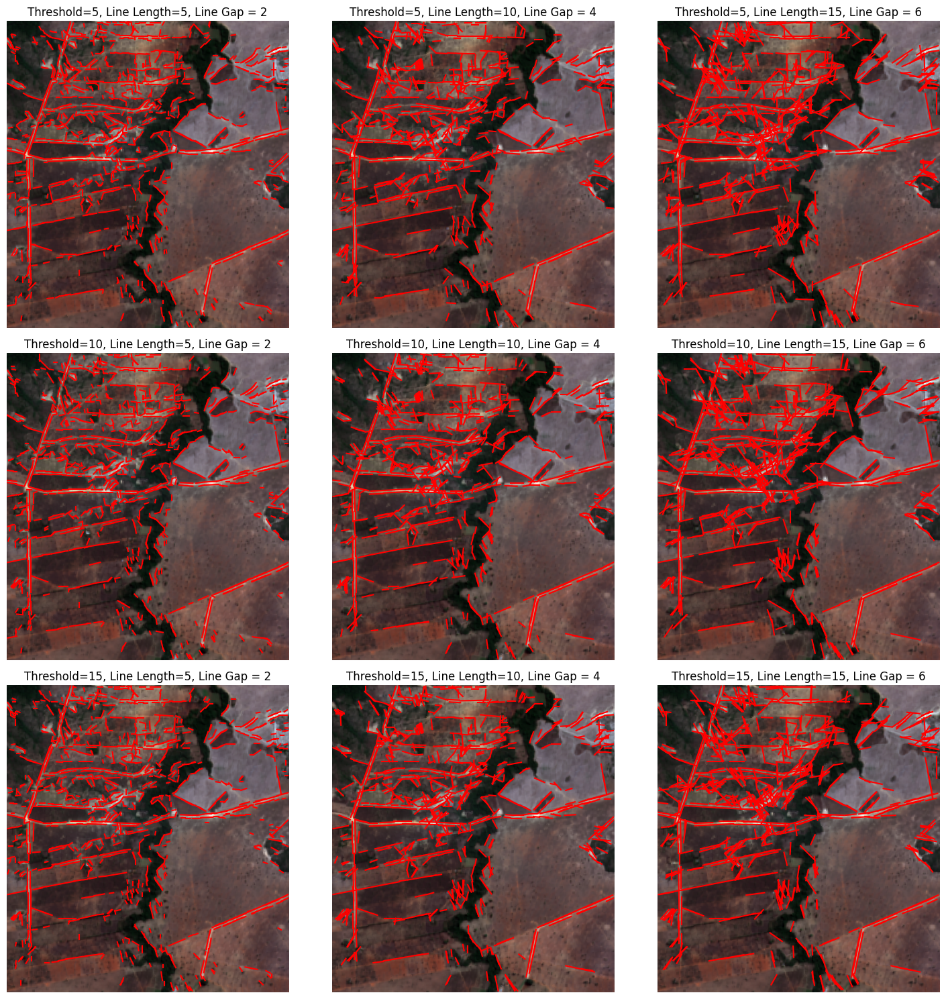

In [ ]:
# config hough parameters
threshold_values = [5, 10, 15]
line_length_values = [5, 10, 15]
line_gap_values = [2, 4, 6]

# canny params
sigma = 1.5
low_threshold = 0.1
high_threshold = low_threshold*2

# get edges
canny_edges = canny(gray_image, sigma=sigma, low_threshold=low_threshold, high_threshold=high_threshold)


fig, axes = plt.subplots(nrows=len(threshold_values), ncols=len(line_length_values) , figsize=(15,15))
for i, threshold in enumerate(threshold_values):
    for j, line_length in enumerate(line_length_values):

        hough_lines = probabilistic_hough_line(canny_edges, threshold=threshold, line_length=line_length, line_gap=line_gap_values[j%3])
        axes[i,j].imshow(rgb)

        for line in hough_lines:
            p0, p1 = line
            axes[i,j].plot((p0[0], p1[0]), (p0[1], p1[1]), color='red')
        axes[i,j].set_title(f'Threshold={threshold}, Line Length={line_length}, Line Gap = {line_gap_values[j%3]}')
        axes[i,j].axis('off')


plt.tight_layout()
plt.show()

# NDVI

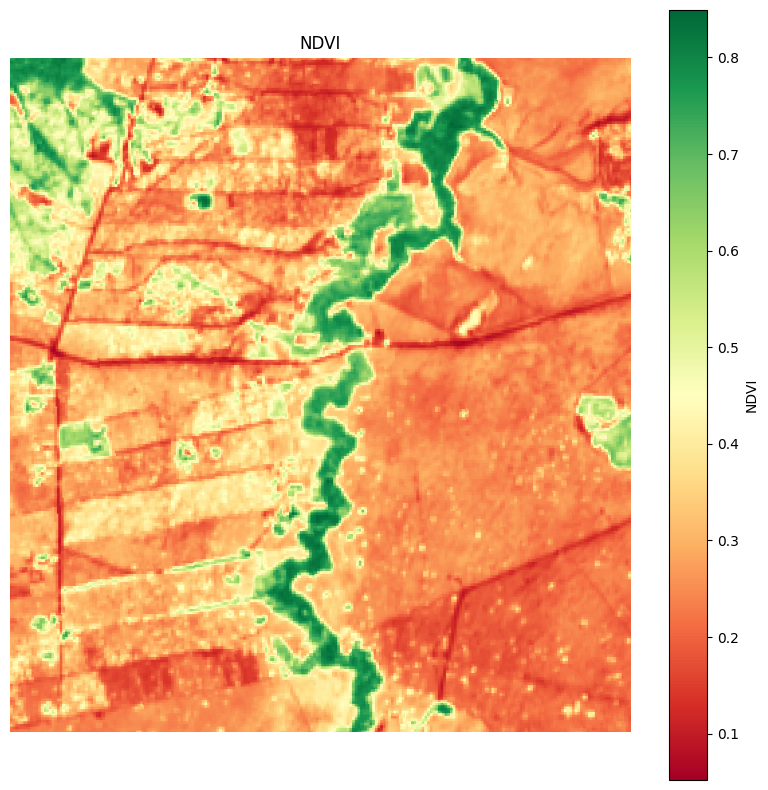

In [ ]:
with rasterio.open('minitile5.tif') as src:
    # read NIR and red bands
    nir = src.read(8)
    red = src.read(4)

    # calc NDVi
    ndvi = (nir - red) / (nir + red)

    # plot
    plt.figure(figsize=(10, 10))
    plt.imshow(ndvi, cmap='RdYlGn')
    plt.colorbar(label='NDVI')
    plt.title('NDVI')
    plt.axis('off')
    plt.show()

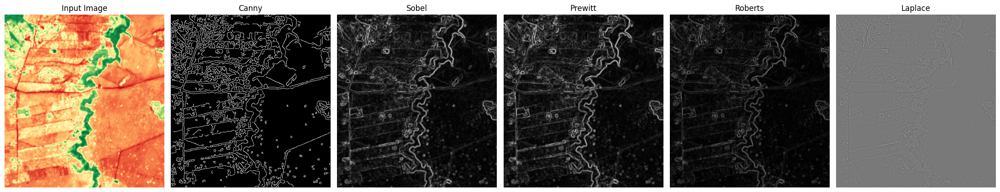

In [ ]:
# apply edge detectors
canny_edges = canny(ndvi)
sobel_edges = sobel(ndvi)
prewitt_edges = prewitt(ndvi)
roberts_edges = roberts(ndvi)
laplace_edges = laplace(ndvi, ksize=3)

# plot
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(22, 7))

axes[0].imshow(ndvi, 'RdYlGn')
axes[0].set_title('Input Image')
axes[0].axis('off')

axes[1].imshow(canny_edges, cmap='gray')
axes[1].set_title('Canny')
axes[1].axis('off')

axes[2].imshow(sobel_edges, cmap='gray')
axes[2].set_title('Sobel')
axes[2].axis('off')

axes[3].imshow(prewitt_edges, cmap='gray')
axes[3].set_title('Prewitt')
axes[3].axis('off')

axes[4].imshow(roberts_edges, cmap='gray')
axes[4].set_title('Roberts')
axes[4].axis('off')

axes[5].imshow(laplace_edges, cmap='gray')
axes[5].set_title('Laplace')
axes[5].axis('off')

plt.tight_layout()
plt.show()

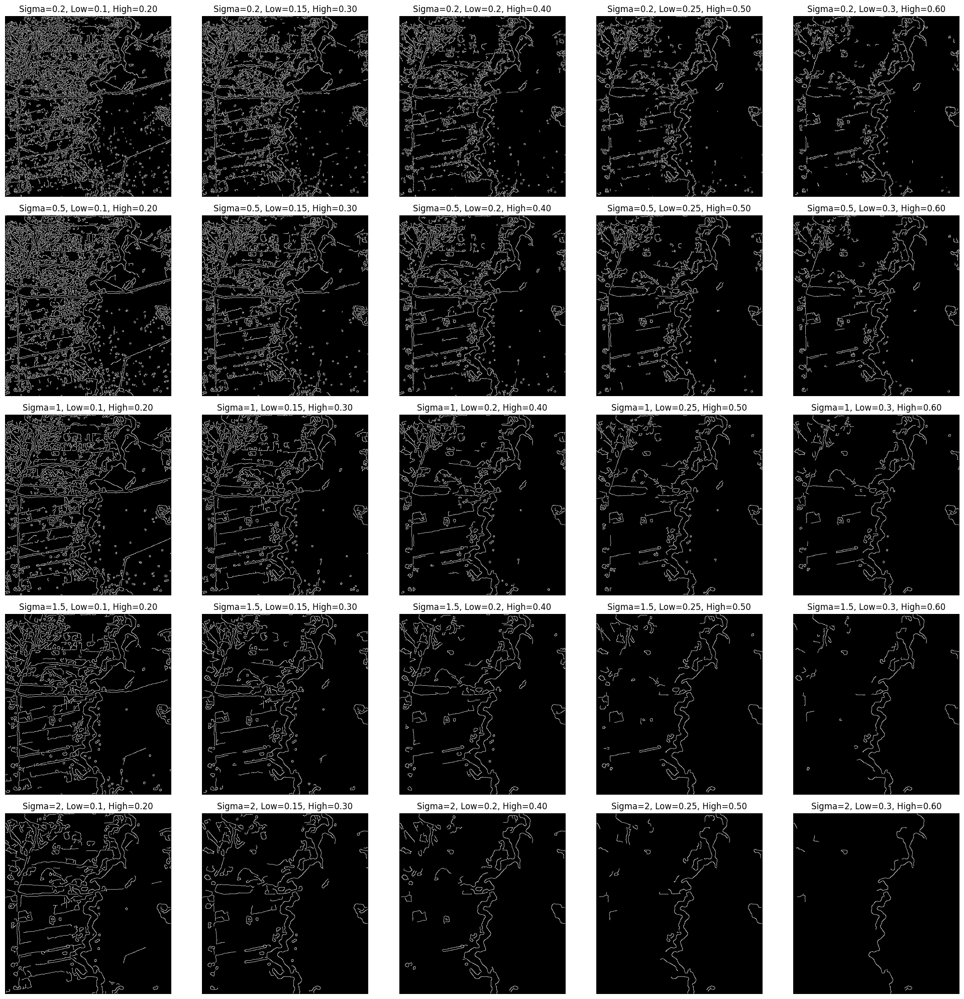

In [ ]:
# canny params
sigma_values = [0.2, 0.5, 1, 1.5, 2]  # Example sigma values
low_threshold_ratios = [0.1, 0.15, 0.2, 0.25, 0.3] # Example low threshold ratios

# config plot
fig, axes = plt.subplots(nrows=len(sigma_values), ncols=len(low_threshold_ratios), figsize=(20, 20))

# get edges and plot
for i, sigma in enumerate(sigma_values):
    for j, low_threshold_ratio in enumerate(low_threshold_ratios):
      high_threshold_ratio = low_threshold_ratio * 2
      canny_edges = canny(ndvi, sigma=sigma, low_threshold=low_threshold_ratio, high_threshold=high_threshold_ratio)
      axes[i, j].imshow(canny_edges, cmap='gray')
      axes[i, j].set_title('Sigma={}, Low={}, High={:.2f}'.format(sigma, low_threshold_ratio, high_threshold_ratio))
      axes[i, j].axis('off')


plt.tight_layout()
plt.show()

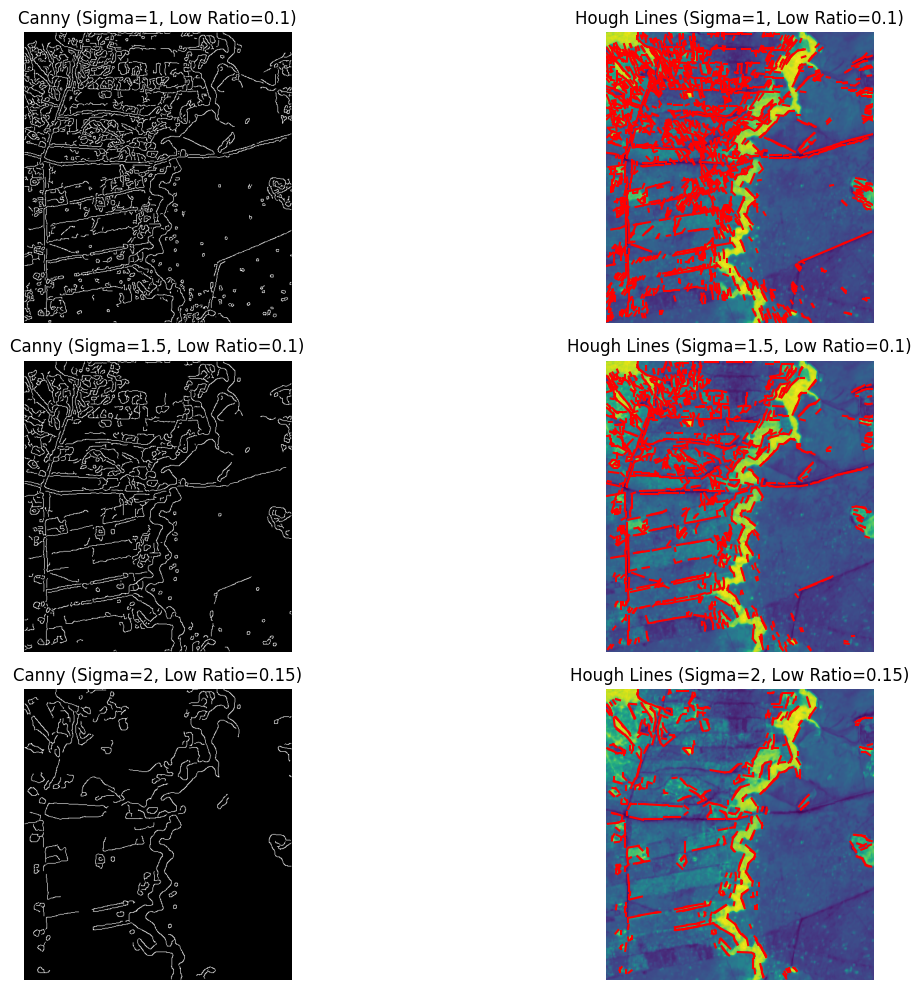

In [ ]:
# parameter settings: no separation, some separation, high separation
sigma_low_values = ((1, 0.1), (1.5, 0.1), (2, 0.15))

# config plot
fig, axes = plt.subplots(nrows=len(sigma_low_values), ncols=2, figsize=(15, 10))

for i, (sigma, low_ratio) in enumerate(sigma_low_values):
    high_ratio = low_ratio * 2
    canny_edges = canny(ndvi, sigma=sigma, low_threshold=low_ratio, high_threshold=high_ratio)

    # apply hough
    hough_lines = probabilistic_hough_line(canny_edges, threshold=10, line_length=5, line_gap=3)

    # plot
    axes[i, 0].imshow(canny_edges, cmap='gray')
    axes[i, 0].set_title(f'Canny (Sigma={sigma}, Low Ratio={low_ratio})')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(ndvi)
    for line in hough_lines:
        p0, p1 = line
        axes[i, 1].plot((p0[0], p1[0]), (p0[1], p1[1]), color='red')
    axes[i, 1].set_title(f'Hough Lines (Sigma={sigma}, Low Ratio={low_ratio})')
    axes[i, 1].axis('off')


plt.tight_layout()
plt.show()

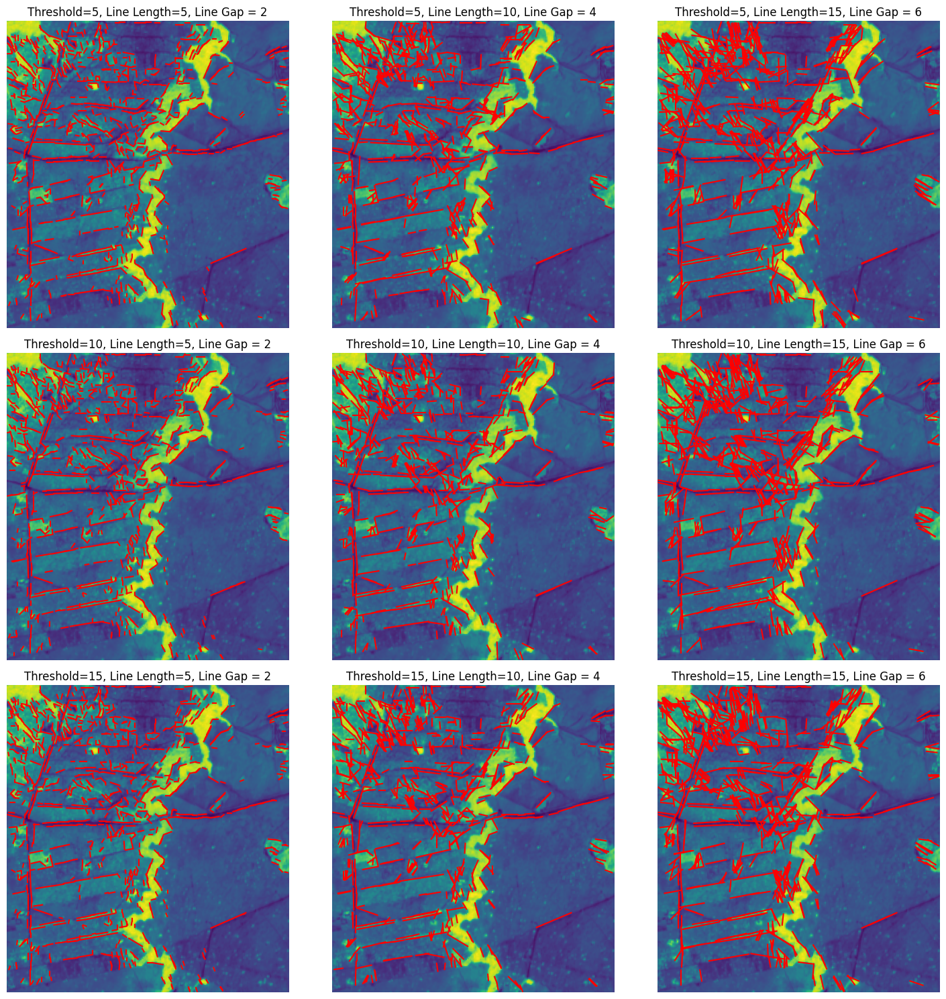

In [ ]:
# config hough parameters
threshold_values = [5, 10, 15]
line_length_values = [5, 10, 15]
line_gap_values = [2, 4, 6]

# canny params
sigma = 1.5
low_threshold = 0.1
high_threshold = low_threshold*2

# get edges
canny_edges = canny(ndvi, sigma=sigma, low_threshold=low_threshold, high_threshold=high_threshold)


fig, axes = plt.subplots(nrows=len(threshold_values), ncols=len(line_length_values) , figsize=(15,15))
for i, threshold in enumerate(threshold_values):
    for j, line_length in enumerate(line_length_values):

        hough_lines = probabilistic_hough_line(canny_edges, threshold=threshold, line_length=line_length, line_gap=line_gap_values[j%3])
        axes[i,j].imshow(ndvi)

        for line in hough_lines:
            p0, p1 = line
            axes[i,j].plot((p0[0], p1[0]), (p0[1], p1[1]), color='red')
        axes[i,j].set_title(f'Threshold={threshold}, Line Length={line_length}, Line Gap = {line_gap_values[j%3]}')
        axes[i,j].axis('off')


plt.tight_layout()
plt.show()

# BSI

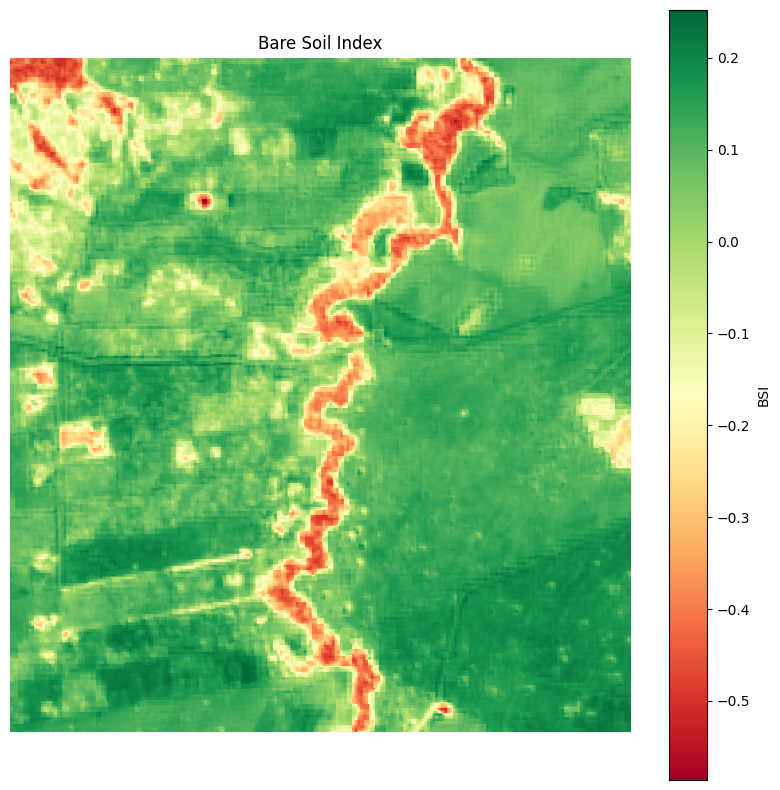

In [ ]:
with rasterio.open('minitile5.tif') as src:
    # read bands
    b2 = src.read(2)
    b4 = src.read(4)
    b8 = src.read(8)
    b12 = src.read(12)

    # calculate BSI
    bsi = ((b12 + b4) - (b8 + b2)) / ((b12 + b4) + (b8 + b2))

    # plot
    plt.figure(figsize=(10, 10))
    plt.imshow(bsi, cmap='RdYlGn')
    plt.colorbar(label='BSI')
    plt.title('Bare Soil Index')
    plt.axis('off')
    plt.show()

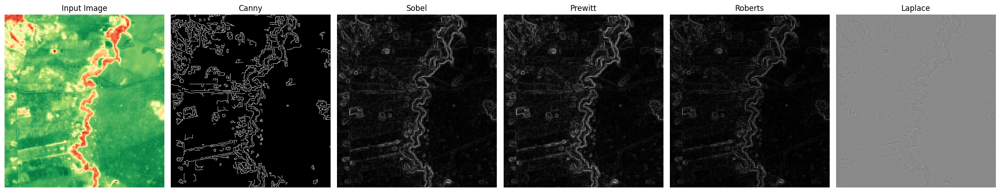

In [ ]:
# apply edge detectors
canny_edges = canny(bsi)
sobel_edges = sobel(bsi)
prewitt_edges = prewitt(bsi)
roberts_edges = roberts(bsi)
laplace_edges = laplace(bsi, ksize=3)

# plot
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(22, 7))

axes[0].imshow(bsi, 'RdYlGn')
axes[0].set_title('Input Image')
axes[0].axis('off')

axes[1].imshow(canny_edges, cmap='gray')
axes[1].set_title('Canny')
axes[1].axis('off')

axes[2].imshow(sobel_edges, cmap='gray')
axes[2].set_title('Sobel')
axes[2].axis('off')

axes[3].imshow(prewitt_edges, cmap='gray')
axes[3].set_title('Prewitt')
axes[3].axis('off')

axes[4].imshow(roberts_edges, cmap='gray')
axes[4].set_title('Roberts')
axes[4].axis('off')

axes[5].imshow(laplace_edges, cmap='gray')
axes[5].set_title('Laplace')
axes[5].axis('off')

plt.tight_layout()
plt.show()

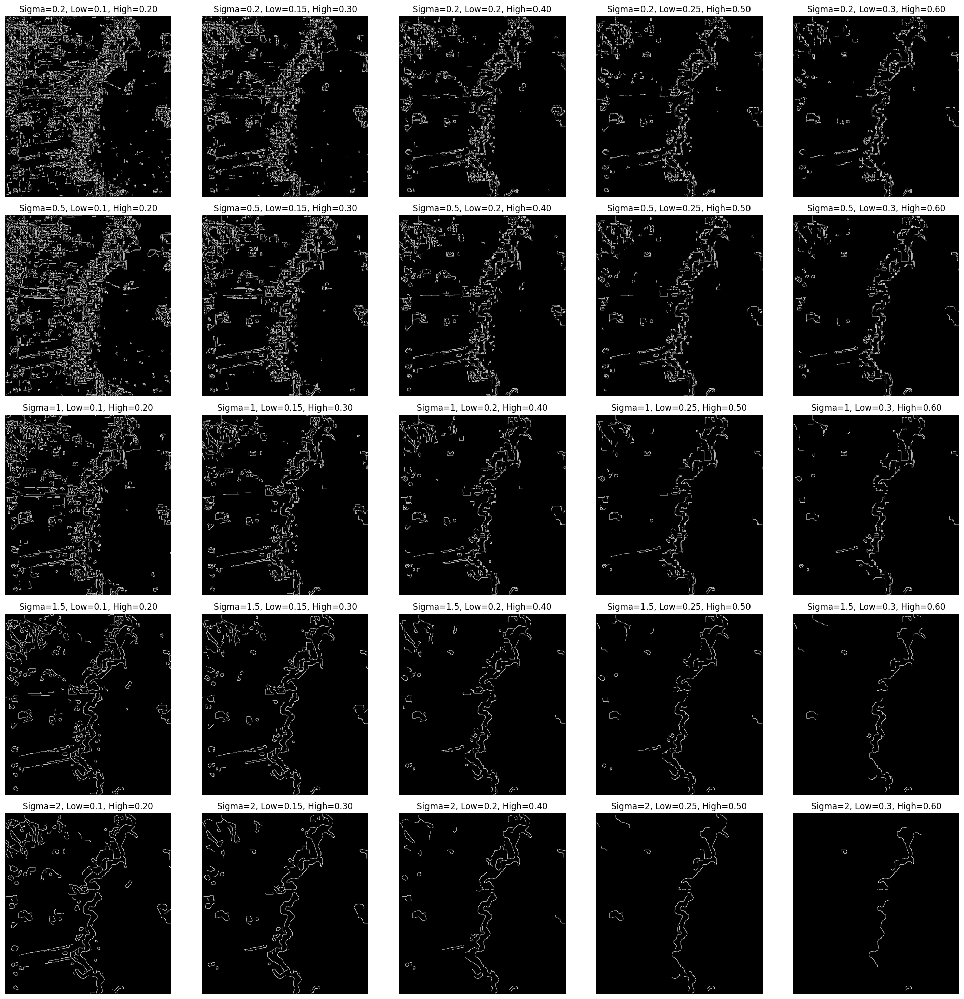

In [ ]:
# canny parameters
sigma_values = [0.2, 0.5, 1, 1.5, 2]  # Example sigma values
low_threshold_ratios = [0.1, 0.15, 0.2, 0.25, 0.3] # Example low threshold ratios

# config plot
fig, axes = plt.subplots(nrows=len(sigma_values), ncols=len(low_threshold_ratios), figsize=(20, 20))

# get edges and plot
for i, sigma in enumerate(sigma_values):
    for j, low_threshold_ratio in enumerate(low_threshold_ratios):
      high_threshold_ratio = low_threshold_ratio * 2
      canny_edges = canny(bsi, sigma=sigma, low_threshold=low_threshold_ratio, high_threshold=high_threshold_ratio)
      axes[i, j].imshow(canny_edges, cmap='gray')
      axes[i, j].set_title('Sigma={}, Low={}, High={:.2f}'.format(sigma, low_threshold_ratio, high_threshold_ratio))
      axes[i, j].axis('off')


plt.tight_layout()
plt.show()

In [ ]:
# not need to go further, canny edges very bad